In [ ]:
import pandas as pd
import numpy as np
                                                                                                                                                                                         import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
from google.colab import files #library to upload files to colab notebook
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Navigate to My Drive directory to store the dataset
%cd /content/drive/MyDrive/Brain tumor mri/datasetmri

In [ ]:
# data containing path to Brain MRI and their corresponding mask
brain_df = pd.read_csv('/content/data_mask.csv')

In [ ]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [ ]:
brain_df.head(5)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [ ]:
brain_df.mask_path[1] # Path to the brain MRI image

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [ ]:
brain_df.image_path[1] # Path to the segmentation mask

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

In [ ]:
# Obtain the number of images with mask
brain_df['mask'].value_counts()

,count
mask,
0,2556
1,1373


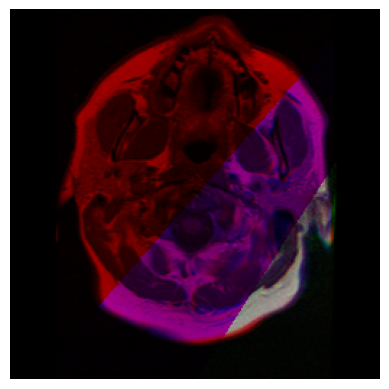

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the image
image_path = 'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'
image = Image.open(image_path)

# Display the image
plt.imshow(image)
plt.axis('off')  # Hide axes
plt.show()


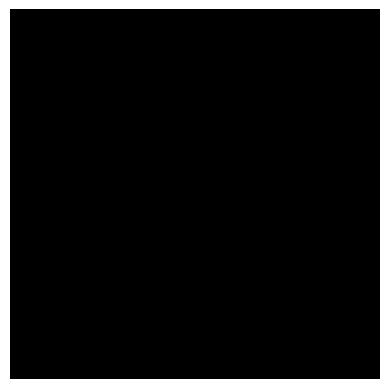

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the mask image
mask_image_path = 'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'
mask_image = Image.open(mask_image_path)

# Display the mask image
plt.imshow(mask_image, cmap='gray')
plt.axis('off')  # Hide axes
plt.show()


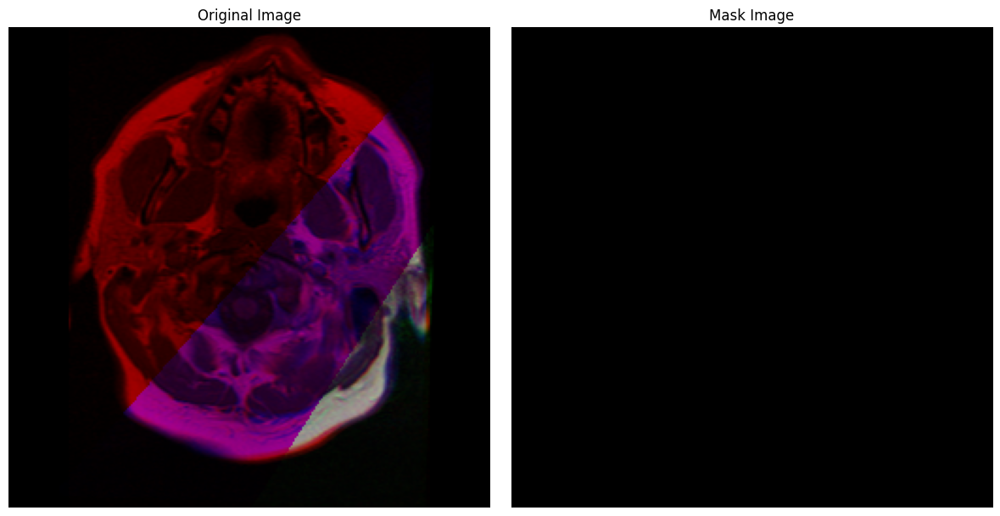

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the original image and the mask image
image_path = 'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'
mask_image_path = 'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

image = Image.open(image_path)
mask_image = Image.open(mask_image_path)

# Create a figure with 2 subplots (side by side)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Display the original image
ax[0].imshow(image)
ax[0].set_title('Original Image')
ax[0].axis('off')  # Hide axes

# Display the mask image
ax[1].imshow(mask_image, cmap='gray')
ax[1].set_title('Mask Image')
ax[1].axis('off')  # Hide axes

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [ ]:
brain_df['mask'].value_counts().index

Index([0, 1], dtype='int64', name='mask')

In [ ]:
# Use plotly to plot interactive bar chart
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 7, opacity = 0.6)
fig.show()

In [ ]:
brain_df.mask_path

,mask_path
0,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
...,...
3924,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...


In [ ]:
brain_df.image_path

,image_path
0,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
...,...
3924,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...


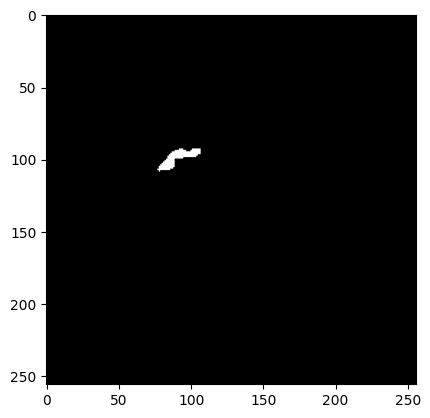

In [ ]:
plt.imshow(cv2.imread(brain_df.mask_path[623]))

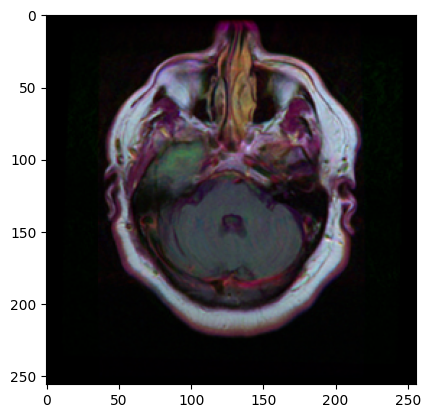

In [ ]:
plt.imshow(cv2.imread(brain_df.image_path[623]))

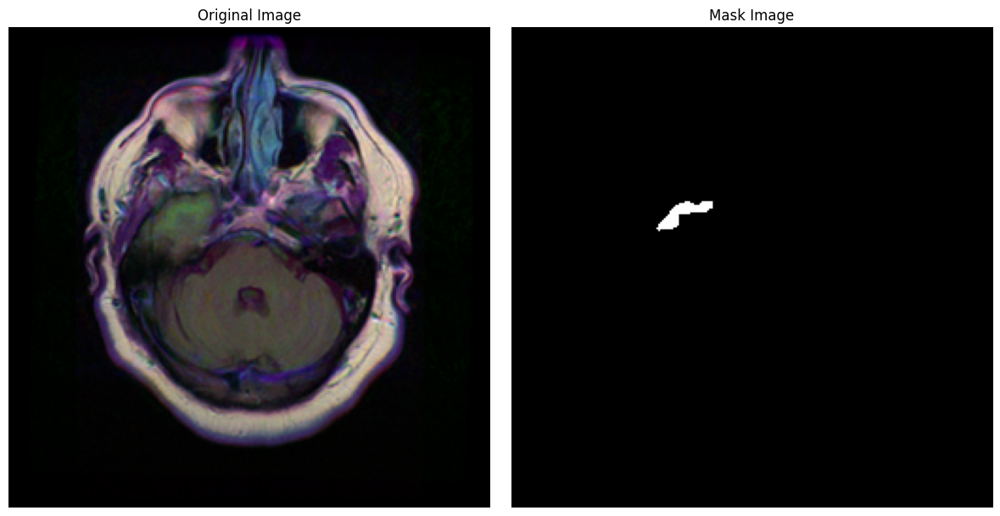

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the image and mask using OpenCV
image = cv2.imread(brain_df.image_path[623])
mask = cv2.imread(brain_df.mask_path[623])

# Convert BGR to RGB (for displaying correctly with matplotlib)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

# Create a figure with 2 subplots (side by side)
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Display the original image
ax[0].imshow(image_rgb)
ax[0].set_title('Original Image')
ax[0].axis('off')  # Hide axes

# Display the mask image
ax[1].imshow(mask_rgb)
ax[1].set_title('Mask Image')
ax[1].axis('off')  # Hide axes

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
cv2.imread(brain_df.mask_path[623]).max()

255

In [ ]:
cv2.imread(brain_df.mask_path[623]).min()

0

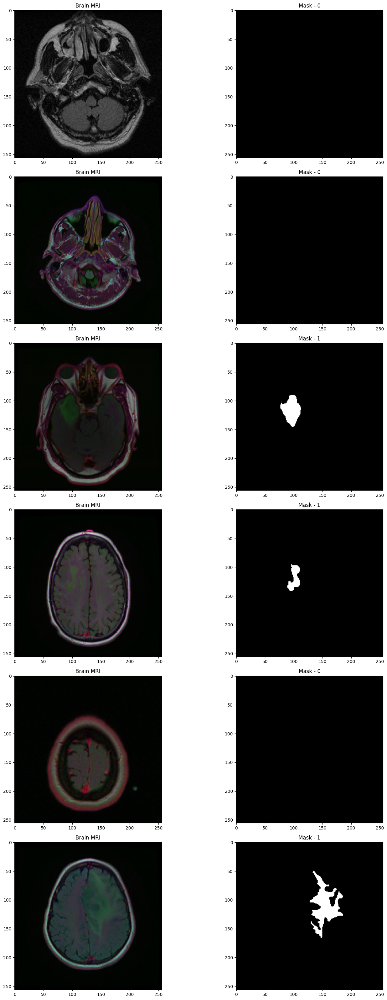

In [ ]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

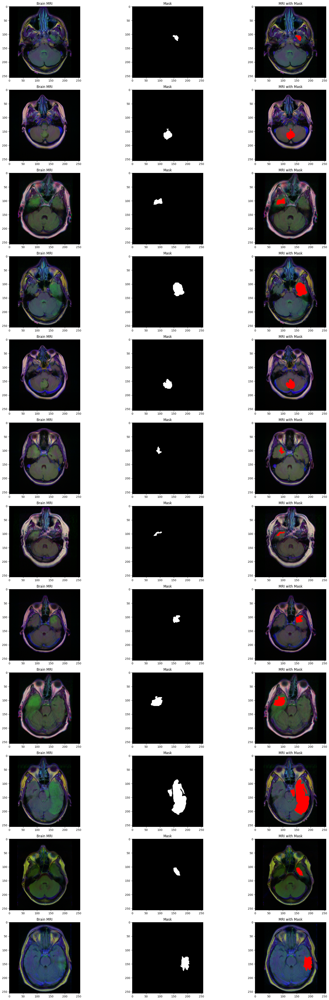

In [ ]:
# Advanced Visualization: visualize the MRI scans along with their mask on one image
count = 0
fig, axs = plt.subplots(12,3, figsize=(20,50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
  # read the images
    img = io.imread(brain_df.image_path[i])
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # obtain the mask for the image
    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')

    # replace the values in the image with red color (255,0,0) if any mask pixel in the mask was = 255
    img[mask == 255] = (255,0,0)
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()

In [ ]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [ ]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
# You will get this error message if you comment out the following code line:
# TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [ ]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [ ]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

In [ ]:
!pip install keras_preprocessing

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.2 MB/s eta 0:00:00


In [ ]:
# create a image generator
from keras_preprocessing.image import ImageDataGenerator

# Create a data generator which scales the data from 0 to 1 and makes validation split of 0.15
datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.15)


In [ ]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))

Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [ ]:
# Get the ResNet50 base model
basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
basemodel.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 262, 262, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 64, 64, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 64, 64, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 64, 64, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
# freeze the model weights

for layer in basemodel.layers:
  layers.trainable = False

In [ ]:
# Add classification head to the base model

headmodel = basemodel.output
headmodel = AveragePooling2D(pool_size = (4,4))(headmodel)
headmodel = Flatten(name= 'flatten')(headmodel)
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)#
headmodel = Dense(256, activation = "relu")(headmodel)
headmodel = Dropout(0.3)(headmodel)
#headmodel = Dense(256, activation = "relu")(headmodel)
#headmodel = Dropout(0.3)(headmodel)
headmodel = Dense(2, activation = 'softmax')(headmodel)

model = Model(inputs = basemodel.input, outputs = headmodel)

In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 262, 262, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 64, 64, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 64, 64, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 64, 64, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 25,751,426 (98.23 MB)

 Trainable params: 25,698,306 (98.03 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

In [ ]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with least validation loss
# Save the best model with least validation loss (using .keras format)
checkpointer = ModelCheckpoint(filepath="classifier-resnet-weights.keras",
                               verbose=1,
                               save_best_only=True)


In [ ]:
history = model.fit(
    train_generator,  # Training data generator
    steps_per_epoch=train_generator.n // 16,  # Number of steps per epoch (batches)
    epochs=40,  # Number of epochs to train
    validation_data=valid_generator,  # Validation data generator
    validation_steps=valid_generator.n // 16,  # Number of steps for validation
    callbacks=[checkpointer, earlystopping]  # List of callbacks (early stopping and model checkpoint)
)


Epoch 1/40


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.6586 - loss: 1.0573 
Epoch 1: val_loss improved from inf to 1.51926, saving model to classifier-resnet-weights.keras
177/177 ━━━━━━━━━━━━━━━━━━━━ 2798s 15s/step - accuracy: 0.6588 - loss: 1.0557 - val_accuracy: 0.6109 - val_loss: 1.5193
Epoch 2/40
  1/177 ━━━━━━━━━━━━━━━━━━━━ 43s 248ms/step - accuracy: 0.7500 - loss: 0.5413

/usr/lib/python3.11/contextlib.py:158: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.




Epoch 2: val_loss did not improve from 1.51926
177/177 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.7500 - loss: 0.5413 - val_accuracy: 0.5000 - val_loss: 2.2035
Epoch 3/40
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - accuracy: 0.7570 - loss: 0.4638
Epoch 3: val_loss improved from 1.51926 to 0.68700, saving model to classifier-resnet-weights.keras
177/177 ━━━━━━━━━━━━━━━━━━━━ 57s 214ms/step - accuracy: 0.7571 - loss: 0.4637 - val_accuracy: 0.6089 - val_loss: 0.6870
Epoch 4/40
  1/177 ━━━━━━━━━━━━━━━━━━━━ 44s 251ms/step - accuracy: 0.8125 - loss: 0.3964
Epoch 4: val_loss improved from 0.68700 to 0.67470, saving model to classifier-resnet-weights.keras
177/177 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.8125 - loss: 0.3964 - val_accuracy: 0.7500 - val_loss: 0.6747
Epoch 5/40
177/177 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.8048 - loss: 0.3975
Epoch 5: val_loss did not improve from 0.67470
177/177 ━━━━━━━━━━━━━━━━━━━━ 37s 205ms/step - accuracy: 0.8049 - loss: 0.3974 - val_

# **Saving the model locally**

In [ ]:
import tensorflow as tf

# Assuming 'model' is your trained CNN model
model.save('/content/your_cnn_model.keras')  # Save the model in the .keras format


# **Saving the model to google drive**

In [ ]:
model.save('/content/drive/MyDrive/your_cnn_model.keras')  # Save to Google Drive

# **Loading the model**

In [ ]:
import tensorflow as tf

# Load the model from Google Drive
model = tf.keras.models.load_model('/content/drive/MyDrive/your_cnn_model.keras')

# Now you can use the model for inference or further training
print("Model loaded successfully.")


Model loaded successfully.


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning:

Skipping variable loading for optimizer 'rmsprop', because it has 220 variables whereas the saved optimizer has 438 variables. 



# **Summary of model loaded**

In [ ]:
# Optionally, you can print the model summary to verify
model.summary()

# Or test the model by making predictions
# predictions = model.predict(test_data)  # Replace with your test data


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 262, 262, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 128, 128, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 128, 128, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 128, 128, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 130, 130, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 64, 64, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 64, 64, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 64, 64, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 64, 64, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 64, 64, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 64, 64, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 64, 64, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 51,449,734 (196.27 MB)

 Trainable params: 25,698,306 (98.03 MB)

 Non-trainable params: 53,120 (207.50 KB)

 Optimizer params: 25,698,308 (98.03 MB)

In [ ]:
test_predict = model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



36/36 ━━━━━━━━━━━━━━━━━━━━ 205s 5s/step


**Save the Training History to Google Drive**

In [ ]:
import json

# Assuming 'history' is the object returned by model.fit()
history_dict = history.history

# Save the history as a .json file in Google Drive
history_path = '/content/drive/MyDrive/training_history.json'
with open(history_path, 'w') as f:
    json.dump(history_dict, f)

print(f"Training history saved to {history_path}")


Training history saved to /content/drive/MyDrive/training_history.json


**Load the Training History from Google Drive**

In [ ]:
import json

# Load the history from Google Drive (the path you saved it to)
history_path = '/content/drive/MyDrive/training_history.json'
with open(history_path, 'r') as f:
    loaded_history = json.load(f)

# Now 'loaded_history' contains the training history
print(loaded_history.keys())  # View the keys (e.g., 'accuracy', 'loss', etc.)


dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


# **Visualization of saved model history**

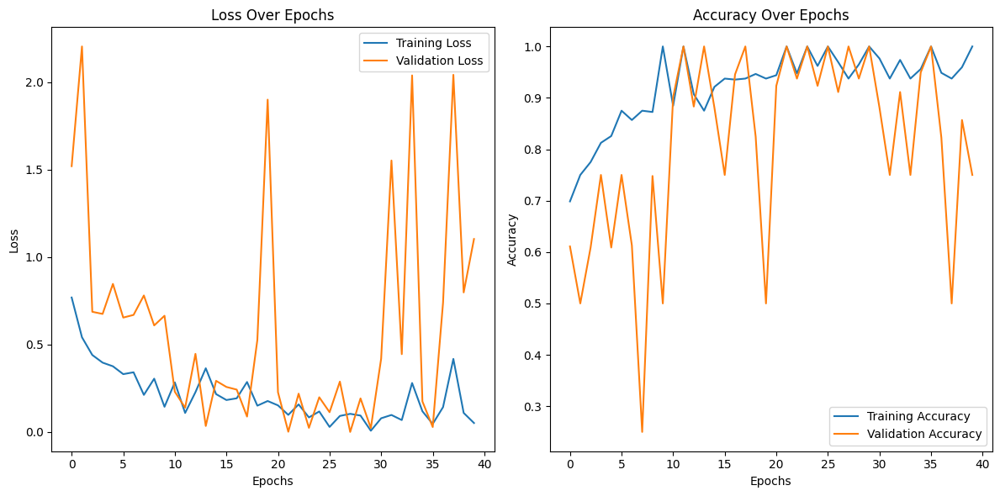

In [ ]:
import matplotlib.pyplot as plt

# Extract the loss and accuracy values from the loaded history
loss = loaded_history['loss']
accuracy = loaded_history['accuracy']
val_loss = loaded_history['val_loss']  # If validation data was used
val_accuracy = loaded_history['val_accuracy']  # If validation data was used

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
test_predict.shape

(576, 2)

In [ ]:
# Obtain the predicted class from the model prediction
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [ ]:
predict

array(['0', '0', '1', '0', '1', '1', '0', '0', '1', '0', '1', '1', '1',
       '0', '1', '0', '1', '1', '0', '0', '1', '0', '1', '1', '1', '1',
       '1', '1', '0', '0', '1', '0', '1', '0', '1', '0', '1', '1', '0',
       '0', '0', '0', '1', '1', '0', '0', '0', '0', '1', '1', '1', '1',
       '1', '0', '1', '0', '1', '1', '1', '0', '1', '0', '0', '0', '1',
       '0', '0', '1', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0',
       '0', '1', '1', '1', '0', '1', '1', '0', '0', '0', '0', '0', '1',
       '1', '1', '0', '0', '0', '1', '1', '0', '0', '0', '0', '0', '0',
       '1', '1', '0', '0', '1', '0', '0', '1', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '1', '1', '0', '0', '1', '1', '1', '0',
       '1', '1', '0', '1', '1', '1', '1', '0', '1', '0', '1', '0', '0',
       '1', '0', '1', '1', '0', '1', '1', '0', '0', '0', '0', '0', '0',
       '1', '1', '1', '1', '1', '1', '0', '0', '1', '0', '1', '1', '1',
       '0', '0', '0', '0', '0', '0', '1', '0', '1', '0', '0', '1

In [ ]:
# since we have used test generator, it limited the images to len(predict), due to batch size
original = np.asarray(test['mask'])[:len(predict)]
len(original)

576

In [ ]:
# Obtain the accuracy of the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.8680555555555556

<Axes: >

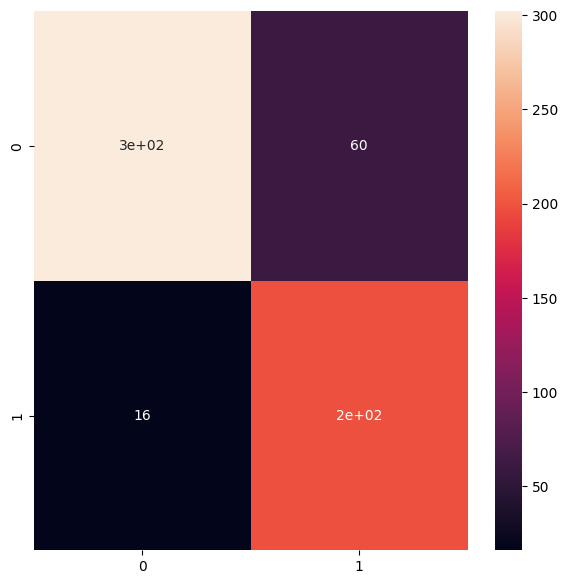

In [ ]:
# plot the confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

In [ ]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.95      0.83      0.89       362
           1       0.77      0.93      0.84       214

   micro avg       0.87      0.87      0.87       576
   macro avg       0.86      0.88      0.86       576
weighted avg       0.88      0.87      0.87       576



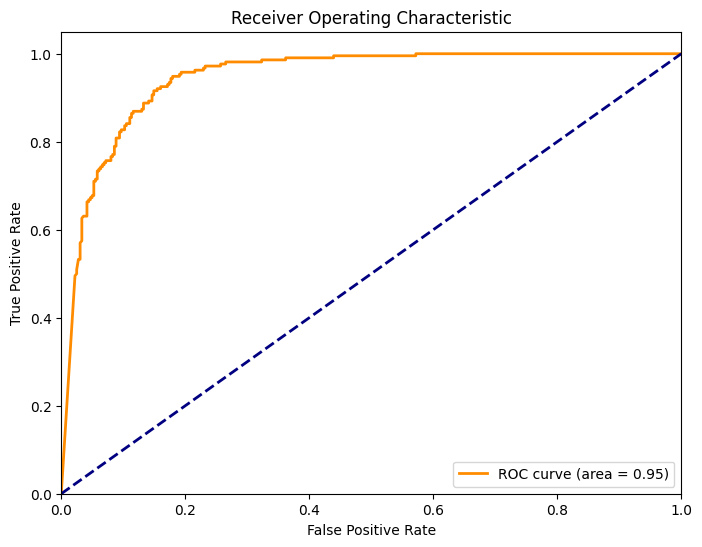

In [ ]:
# prompt: plot ROC graph

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming 'test_predict' contains predicted probabilities for the positive class (class 1)
# and 'original' contains the true labels (0 or 1)

# Extract probabilities for the positive class
y_pred_prob = test_predict[:, 1]  # Assuming class 1 is at index 1

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(original.astype(int), y_pred_prob)

# Calculate the AUC
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

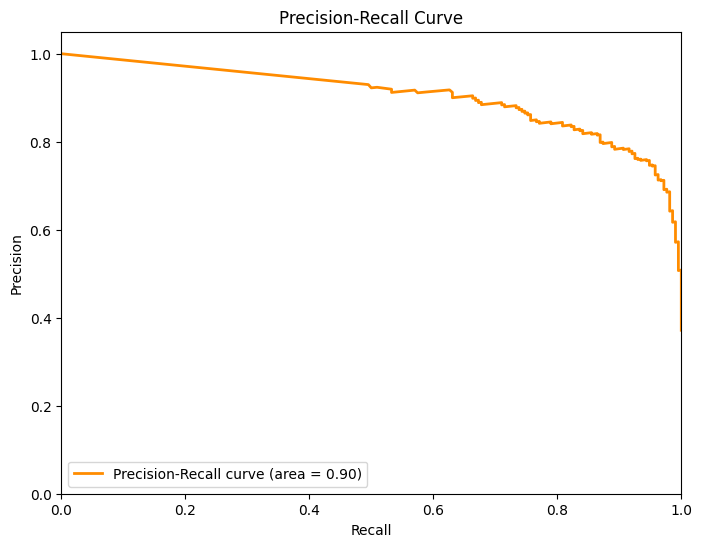

In [ ]:
# prompt: plot accuracy vs precision graph

import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc

# Assuming 'original' contains the true labels (0 or 1)
# and 'y_pred_prob' contains predicted probabilities for the positive class (class 1)
#  (as calculated in the previous code example)

# Calculate precision and recall
precision, recall, thresholds = precision_recall_curve(original.astype(int), y_pred_prob)

# Calculate the area under the precision-recall curve
pr_auc = auc(recall, precision)

# Plot the precision-recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='darkorange', lw=2, label='Precision-Recall curve (area = %0.2f)' % pr_auc)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left")
plt.show()

# **BUILD A SEGMENTATION MODEL TO LOCALIZE TUMOR**

In [ ]:
# Get the dataframe containing MRIs which have masks associated with them.
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [ ]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)

In [ ]:
# create separate list for imageId, classId to pass into the generator

train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)

val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)

In [ ]:
import importlib.util
import sys

# Specify the path to your utilities file
path_to_utilities = '/content/drive/MyDrive/utilities (1).py'

# Load the spec and module
spec = importlib.util.spec_from_file_location("utilities", path_to_utilities)
utilities = importlib.util.module_from_spec(spec)
sys.modules["utilities"] = utilities
spec.loader.exec_module(utilities)

# Now you can use DataGenerator from utilities
DataGenerator = utilities.DataGenerator

# create image generators
training_generator = DataGenerator(train_ids, train_mask)
validation_generator = DataGenerator(val_ids, val_mask)


In [ ]:
def resblock(X, f):


  # make a copy of input
  X_copy = X

  # main path
  # Read more about he_normal: https://medium.com/@prateekvishnu/xavier-and-he-normal-he-et-al-initialization-8e3d7a087528

  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)

  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)

  # Short path
  # Read more here: https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33

  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)

  # Adding the output from main path and short path together

  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [ ]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
  x = UpSampling2D((2,2))(x)
  merge = Concatenate()([x, skip])

  return merge

# **Segmentation Model Architecture**

In [ ]:
input_shape = (256,256,3)

# Input tensor shape
X_input = Input(input_shape)

# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)

# Stage 2
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)

# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)

# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)

# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)

# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)

# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)

# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)

# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)

# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)

model_seg = Model(inputs = X_input, outputs = output )

In [ ]:
model_seg.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 16)   │            448 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 16)   │             64 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 16)   │          2,320 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 16)   │             64 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 16)   │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 32)   │            544 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 32)   │            128 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 128, 128, 32)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 32)   │          9,248 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 32)   │            544 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 32)   │            128 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 128, 128, 32)   │            128 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 128, 128, 32)   │              0 │ batch_normalization_3… │
│                           │                        │                │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 128, 128, 32)   │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1      

 Total params: 1,210,513 (4.62 MB)

 Trainable params: 1,206,129 (4.60 MB)

 Non-trainable params: 4,384 (17.12 KB)

In [ ]:
#from utilities import focal_tversky, tversky_loss, tversky

In [ ]:
# Compile the model
#adam = tf.keras.optimizers.Adam(learning_rate=0.05, epsilon=0.1)
#model_seg.compile(optimizer=adam, loss=focal_tversky, metrics=[tversky])


In [ ]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="ResUNet-weights.keras", verbose=1, save_best_only=True)

In [ ]:
# Check the first item from the training and validation generators
x_train_sample, y_train_sample = training_generator[0]
x_val_sample, y_val_sample = validation_generator[0]
print(f"Training sample shapes: {x_train_sample.shape}, {y_train_sample.shape}")
print(f"Validation sample shapes: {x_val_sample.shape}, {y_val_sample.shape}")


Training sample shapes: (16, 256, 256, 3), (16, 256, 256, 1)
Validation sample shapes: (16, 256, 256, 3), (16, 256, 256, 1)


In [ ]:
import tensorflow as tf
import tensorflow.keras.backend as K

def tversky(y_true, y_pred, smooth=1):
    """
    Calculates the Tversky index for semantic segmentation.

    Args:
        y_true: Ground truth segmentation masks (int64 or float32).
        y_pred: Predicted segmentation masks (float32).
        smooth: Smoothing factor to avoid division by zero.

    Returns:
        The Tversky index (float32).
    """
    # Ensure both tensors have the same data type (float32)
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    alpha = 0.7  # Weighting factor for false negatives
    return (true_pos + smooth) / (true_pos + alpha * false_neg + (1 - alpha) * false_pos + smooth)

In [ ]:
x_sample, y_sample = training_generator[0]
print(f"Sample input shape: {x_sample.shape}, Sample label shape: {y_sample.shape}")


Sample input shape: (16, 256, 256, 3), Sample label shape: (16, 256, 256, 1)


In [ ]:
x_sample, y_sample = training_generator[0]
print("Input data stats:", np.mean(x_sample), np.std(x_sample))
print("Label data stats:", np.unique(y_sample, return_counts=True))


Input data stats: 5.782411586589357e-19 1.0000000000000002
Label data stats: (array([0, 1]), array([1009102,   39474]))


# **Detour**

In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K

def tversky_index(y_true, y_pred, smooth=1e-5, alpha=0.7, beta=0.3):
    """
    Tversky index for binary segmentation.
    alpha: controls the penalty for false negatives.
    beta: controls the penalty for false positives.
    """
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1 - y_pred_pos))
    false_pos = K.sum((1 - y_true_pos) * y_pred_pos)
    return (true_pos + smooth) / (true_pos + alpha * false_neg + beta * false_pos + smooth)

def tversky_loss(y_true, y_pred):
    """
    Tversky loss function.
    """
    return 1 - tversky_index(y_true, y_pred)

def focal_tversky_loss(y_true, y_pred, gamma=0.75):
    """
    Focal Tversky loss, which uses the Tversky index and focuses more on harder examples.
    gamma: focusing parameter. gamma > 1 makes the loss focus more on hard examples.
    """
    tv = tversky_index(y_true, y_pred)
    return K.pow((1 - tv), gamma)

# Compile the model with the chosen loss function
model_seg.compile(optimizer='adam', loss=focal_tversky_loss, metrics=['accuracy'])


In [ ]:
model_seg.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 16)   │            448 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 16)   │             64 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 16)   │          2,320 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 16)   │             64 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 16)   │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 32)   │            544 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 32)   │            128 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 128, 128, 32)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 32)   │          9,248 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 32)   │            544 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 32)   │            128 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 128, 128, 32)   │            128 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 128, 128, 32)   │              0 │ batch_normalization_3… │
│                           │                        │                │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 128, 128, 32)   │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1      

 Total params: 1,210,513 (4.62 MB)

 Trainable params: 1,206,129 (4.60 MB)

 Non-trainable params: 4,384 (17.12 KB)

In [ ]:
history = model_seg.fit(training_generator, epochs=20, validation_data=validation_generator)

Epoch 1/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 18s 226ms/step - accuracy: 0.9787 - loss: 0.4374 - val_accuracy: 0.9152 - val_loss: 0.6736
Epoch 2/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 20s 215ms/step - accuracy: 0.9855 - loss: 0.3297 - val_accuracy: 0.9878 - val_loss: 0.3073
Epoch 3/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.9878 - loss: 0.2818 - val_accuracy: 0.9871 - val_loss: 0.2951
Epoch 4/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 20s 192ms/step - accuracy: 0.9895 - loss: 0.2446 - val_accuracy: 0.9917 - val_loss: 0.2839
Epoch 5/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 22s 209ms/step - accuracy: 0.9906 - loss: 0.2267 - val_accuracy: 0.9903 - val_loss: 0.2471
Epoch 6/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 16s 201ms/step - accuracy: 0.9917 - loss: 0.2015 - val_accuracy: 0.9918 - val_loss: 0.2369
Epoch 7/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 21s 206ms/step - accuracy: 0.9914 - loss: 0.2021 - val_accuracy: 0.9905 - val_loss: 0.2284
Epoch 8/20
72/72 ━━━━━━━━━━━━━━━━━━━━ 16s 201ms/step - accuracy: 0.9919 - loss: 0.1829 - val_accu

# **Saving segmentation model**

In [ ]:
model_seg.save('/content/drive/MyDrive/model_seg.keras')

# **Loading saved seg mdel**

In [ ]:
# prompt: write code to load model_seg

import tensorflow as tf

# Load the model from Google Drive
model_seg = tf.keras.models.load_model('/content/drive/MyDrive/model_seg.keras', compile=False)

# Now you can use the model for inference or further training
print("Segmentation Model loaded successfully.")

# # **Summary of model loaded**
# Optionally, you can print the model summary to verify
model_seg.summary()

Segmentation Model loaded successfully.


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 16)   │            448 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 16)   │             64 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 16)   │          2,320 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 16)   │             64 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 16)   │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 32)   │            544 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 32)   │            128 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 128, 128, 32)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 32)   │          9,248 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 32)   │            544 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 32)   │            128 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 128, 128, 32)   │            128 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 128, 128, 32)   │              0 │ batch_normalization_3… │
│                           │                        │                │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 128, 128, 32)   │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1      

 Total params: 1,210,513 (4.62 MB)

 Trainable params: 1,206,129 (4.60 MB)

 Non-trainable params: 4,384 (17.12 KB)

# **Saving model history**

In [ ]:
# prompt: write code to save the model_seg history to google drive

# Save the model training history to Google Drive
import json

history_path = '/content/drive/MyDrive/model_seg_history.json'
with open(history_path, 'w') as f:
    json.dump(history.history, f)

print(f"Model Segmentation Training history saved to {history_path}")

Model Segmentation Training history saved to /content/drive/MyDrive/model_seg_history.json


In [ ]:
# prompt: write code to load model_seg_history from google drive

import json

# Load the model training history from Google Drive
path_history= '/content/drive/MyDrive/model_seg_history.json'
with open(history_path, 'r') as f:
    model_seg_history = json.load(f)

print(model_seg_history.keys()) # View the keys (e.g., 'accuracy', 'loss', etc.)

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


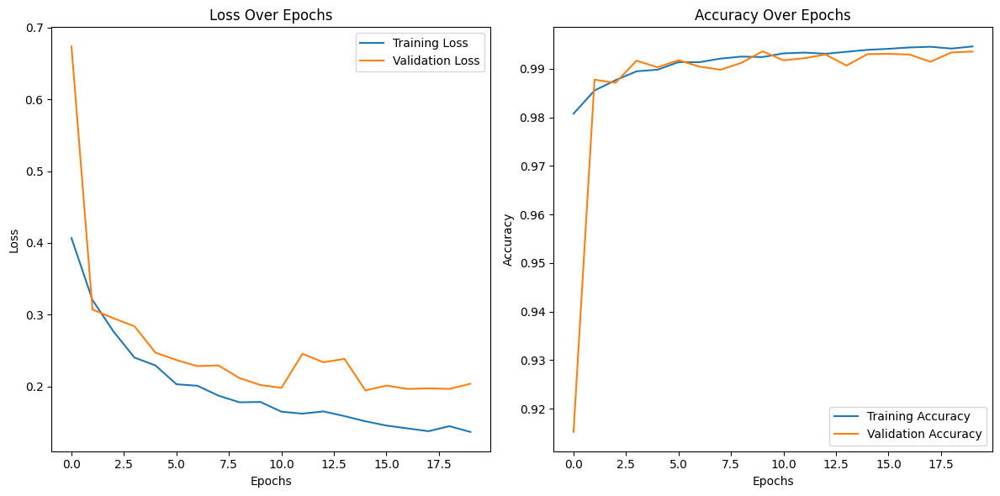

In [ ]:
# prompt: write code to plot the accuracy and loss from /content/drive/MyDrive/model_seg_history.json

import json
import matplotlib.pyplot as plt

# Load the model training history from Google Drive
history_path = '/content/drive/MyDrive/model_seg_history.json'
with open(history_path, 'r') as f:
    model_seg_history = json.load(f)

# Extract the loss and accuracy values
loss = model_seg_history['loss']
accuracy = model_seg_history['accuracy']
val_loss = model_seg_history['val_loss']
val_accuracy = model_seg_history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

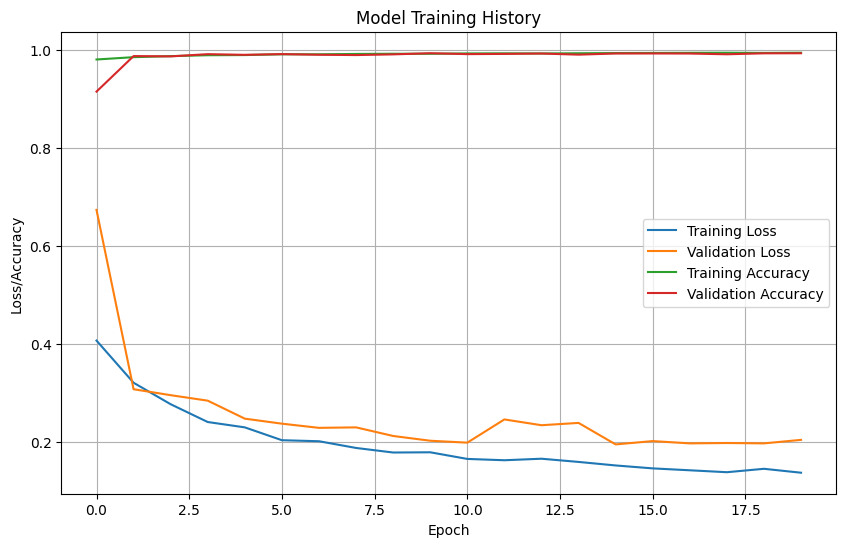

In [ ]:
# prompt: write code to plot the accuracy and loss from /content/drive/MyDrive/model_seg_history.json, plot this one graph

import json
import matplotlib.pyplot as plt

# Load the model training history from Google Drive
history_path = '/content/drive/MyDrive/model_seg_history.json'
with open(history_path, 'r') as f:
    model_seg_history = json.load(f)

# Extract the loss and accuracy values
loss = model_seg_history['loss']
accuracy = model_seg_history['accuracy']
val_loss = model_seg_history['val_loss']
val_accuracy = model_seg_history['val_accuracy']

# Plot training and validation loss and accuracy on the same graph
plt.figure(figsize=(10, 6))

plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')

plt.title('Model Training History')
plt.xlabel('Epoch')
plt.ylabel('Loss/Accuracy')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# prompt: write code to print the accuracy of the segmentation model saved

print(f"The accuracy of the segmentation model is: {val_accuracy[-1]}")

The accuracy of the segmentation model is: 0.9935731887817383


In [ ]:
import tensorflow as tf

# Load the model directly using tf.keras.models.load_model
model_seg = tf.keras.models.load_model('/content/drive/MyDrive/model_seg.keras', compile=False)

# If you need to compile the model again:
# adam = tf.keras.optimizers.Adam(lr=0.05, epsilon=0.1)
# model_seg.compile(optimizer=adam, loss=focal_tversky, metrics=[tversky])

print("Segmentation Model loaded successfully.")

Segmentation Model loaded successfully.


In [ ]:
# load the model architecture
#model_seg = tf.keras.models.model_from_json(model_seg)
#model_seg.load_weights('weights_seg.hdf5')
adam = tf.keras.optimizers.Adam(learning_rate= 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [ ]:
from utilities import prediction

# making prediction
image_id, mask, has_mask = prediction(test, model, model_seg)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231

In [ ]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_3.tif,No mask,0
1,TCGA_HT_7856_19950831/TCGA_HT_7856_19950831_10...,No mask,0
2,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_32...,"[[[[0.00010888], [5.5560038e-05], [8.625343e-0...",1
3,TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_9.tif,No mask,0
4,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_19...,"[[[[7.032491e-05], [4.4762863e-05], [6.172513e...",1
...,...,...,...
585,TCGA_DU_8162_19961029/TCGA_DU_8162_19961029_18...,"[[[[0.000106], [5.2460917e-05], [8.4366504e-05...",1
586,TCGA_DU_A5TP_19970614/TCGA_DU_A5TP_19970614_17...,No mask,0
587,TCGA_HT_8563_19981209/TCGA_HT_8563_19981209_1.tif,No mask,0
588,TCGA_DU_8163_19961119/TCGA_DU_8163_19961119_26...,No mask,0


In [ ]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_3.tif,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_3_...,0,No mask,0
1,TCGA_HT_7856_19950831/TCGA_HT_7856_19950831_10...,TCGA_HT_7856_19950831/TCGA_HT_7856_19950831_10...,0,No mask,0
2,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_32...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_32...,1,"[[[[0.00010888], [5.5560038e-05], [8.625343e-0...",1
3,TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_9.tif,TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_9_...,0,No mask,0
4,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_19...,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_19...,1,"[[[[7.032491e-05], [4.4762863e-05], [6.172513e...",1


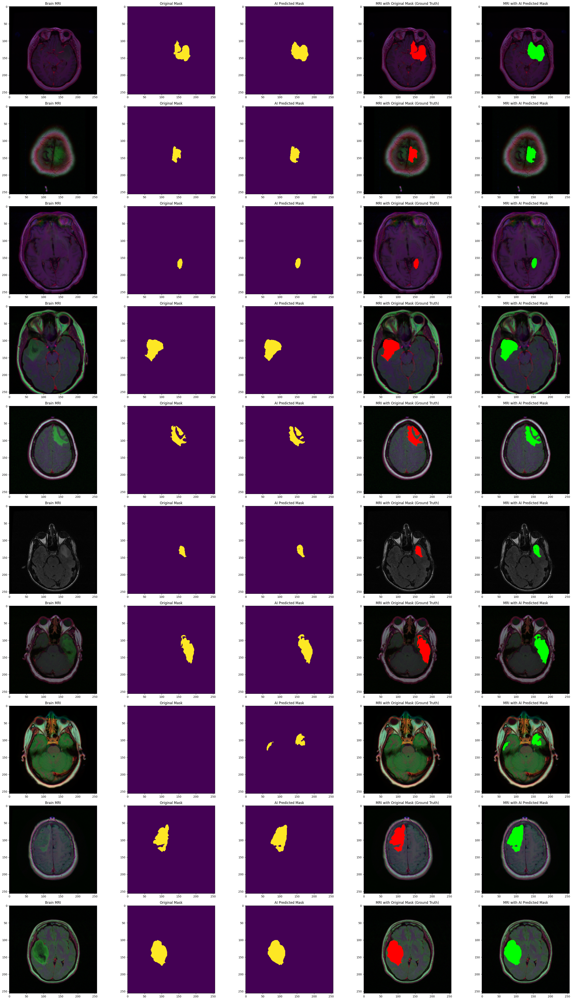

In [ ]:
count = 0
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)

    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()

In [ ]:
# prompt: write code to find the dice co efficient

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_curve, auc, precision_recall_curve
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'original' contains the true labels (0 or 1)
# and 'test_predict' contains predicted probabilities for each class
# Example: test_predict[:, 1] for probabilities of class 1

# Obtain the predicted class from the model prediction
predict = []
for i in test_predict:
  predict.append(str(np.argmax(i)))
predict = np.asarray(predict)

original = np.asarray(test['mask'])[:len(predict)]

# Calculate Dice coefficient
def dice_coefficient(y_true, y_pred):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred)
    if union == 0:
        return 1.0 # Handle the case where both are empty
    return (2.0 * intersection) / union

dice = dice_coefficient(original.astype(int), predict.astype(int))
print(f"Dice Coefficient: {dice}")

Dice Coefficient: 0.8389830508474576


In [ ]:
pip install fastapi uvicorn tensorflow numpy pillow opencv-python requests python-multipart

In [ ]:
from fastapi import FastAPI, UploadFile, File
import numpy as np
import tensorflow as tf
import keras.backend as K
from PIL import Image
import io
import nest_asyncio
import uvicorn

app = FastAPI()

# Define & Register Focal Tversky Loss Function
def focal_tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3, gamma=0.75):
    smooth = 1e-6  # To avoid division by zero
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)

    true_pos = K.sum(y_true * y_pred)
    false_neg = K.sum(y_true * (1 - y_pred))
    false_pos = K.sum((1 - y_true) * y_pred)

    tversky_index = (true_pos + smooth) / (true_pos + alpha * false_neg + beta * false_pos + smooth)

    return K.pow((1 - tversky_index), gamma)

# Register custom loss function
tf.keras.utils.get_custom_objects()["focal_tversky_loss"] = focal_tversky_loss

# Load Tumor Detection Model
detection_model_path = "/content/drive/MyDrive/your_cnn_model.keras"
detection_model = tf.keras.models.load_model(detection_model_path)

# Load Tumor Segmentation Model (with custom loss function)
segmentation_model_path = "/content/drive/MyDrive/model_seg.keras"
segmentation_model = tf.keras.models.load_model(
    segmentation_model_path,
    custom_objects={'focal_tversky_loss': focal_tversky_loss}
)

# Preprocessing Function
def preprocess_image(image_bytes, target_size=(256, 256)):
    image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    image = image.resize(target_size)
    image = np.array(image) / 255.0  # Normalize
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

@app.post("/predict/")
async def predict(file: UploadFile = File(...)):
    image_bytes = await file.read()
    image = preprocess_image(image_bytes)

    # Step 1: Tumor Detection
    detection_result = detection_model.predict(image)
    tumor_present = detection_result[0][0] > 0.5  # Assuming binary classification

    if not tumor_present:
        return {"detection": "No Tumor Detected"}

    # Step 2: Tumor Segmentation
    segmentation_result = segmentation_model.predict(image)
    segmented_mask = segmentation_result[0].tolist()  # Convert NumPy array to list

    return {
        "detection": "Tumor Detected",
        "segmentation_mask": segmented_mask
    }

# ✅ Fix for Jupyter Notebook
nest_asyncio.apply()  # Allows running FastAPI in Jupyter

if __name__ == "__main__":
    uvicorn.run(app, host="0.0.0.0", port=8000)


ERROR:asyncio:Task exception was never retrieved
future: <Task finished name='Task-25' coro=<Server.serve() done, defined at /usr/local/lib/python3.11/dist-packages/uvicorn/server.py:68> exception=KeyboardInterrupt()>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/uvicorn/main.py", line 579, in run
    server.run()
  File "/usr/local/lib/python3.11/dist-packages/uvicorn/server.py", line 66, in run
    return asyncio.run(self.serve(sockets=sockets))
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/nest_asyncio.py", line 30, in run
    return loop.run_until_complete(task)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/nest_asyncio.py", line 92, in run_until_complete
    self._run_once()
  File "/usr/local/lib/python3.11/dist-packages/nest_asyncio.py", line 133, in _run_once
    handle._run()
  File "/usr/lib/python3.11/asyncio/events.py", line 84, in _run
    s

In [ ]:
from fastapi import FastAPI, UploadFile, File
import numpy as np
import tensorflow as tf
from PIL import Image
import io
import uvicorn

app = FastAPI()

# Load Models
detection_model = tf.keras.models.load_model("/content/drive/MyDrive/your_cnn_model.keras")
segmentation_model = tf.keras.models.load_model("/content/drive/MyDrive/model_seg.keras")

# Preprocessing Function
def preprocess_image(image_bytes, target_size=(256, 256)):
    image = Image.open(io.BytesIO(image_bytes)).convert("RGB")
    image = image.resize(target_size)
    image = np.array(image) / 255.0  # Normalize
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

@app.post("/predict/")
async def predict(file: UploadFile = File(...)):
    image_bytes = await file.read()
    image = preprocess_image(image_bytes)

    # Tumor Detection
    detection_result = detection_model.predict(image)
    tumor_present = detection_result[0][0] > 0.5

    if not tumor_present:
        return {"detection": "No Tumor Detected"}

    # Tumor Segmentation
    segmentation_result = segmentation_model.predict(image)
    segmented_mask = segmentation_result[0].tolist()

    return {
        "detection": "Tumor Detected",
        "segmentation_mask": segmented_mask
    }

if __name__ == "__main__":
    uvicorn.run(app, host="0.0.0.0", port=8000)


INFO:     Started server process [260]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)
INFO:     Shutting down
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:     Finished server process [260]


In [ ]:
!pip install pyngrok
from pyngrok import ngrok

public_url = ngrok.connect(8000).public_url
print("FastAPI is live at:", public_url)


In [ ]:
import requests

url = "http://0.0.0.0:8000/predict/"
file_path = "/content/sample_img.tif"  # Replace with your MRI image path

with open(file_path, "rb") as f:
    response = requests.post(url, files={"file": f})

print(response.json())



KeyboardInterrupt



In [ ]:
import requests

url = "http://0.0.0.0:8000/predict/"
file_path = "path/to/sample_mri.jpg"  # Replace with an actual MRI image path

with open(file_path, "rb") as f:
    response = requests.post(url, files={"file": f})

print(response.json())


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!git config --global user.name "thenoobmlengineer"
!git config --global user.email "abdulahadshan4@gmail.com"

In [ ]:
%cd /content/drive/MyDrive/Fypahad2  # Change path accordingly


[Errno 2] No such file or directory: '/content/drive/MyDrive/Fypahad2 # Change path accordingly'
/content/colab-project


In [ ]:
!ls /content/drive/MyDrive/


'AbdulAhad (1).pdf'
'Abdul Ahad ML CV (1).pdf'
'Abdul Ahad ML CV.pdf'
'Abdul Ahad Shan Cover letter.docx'
'Abdul Ahad Shan CV updated (1).pdf'
'Abdul Ahad Shan CV updated.docx'
'Abdul Ahad Shan CV updated.pdf'
'Abdul_Ahad_Shan Resume (1).pdf'
'Abdul_Ahad_Shan Resume.pdf'
'archive (2).zip'
'brain-tumor-detection-and-segmentation-with-mri (2).ipynb'
'Brain tumor mri'
'Colab Notebooks'
 data_mask.csv
'Document from Abdul Ahad'
 Healthcare_AI.ipynb
 Healthgait.ipynb
'kaggle (5).json'
 model_seg30_history.json
 model_seg30.keras
 model_seg.h5
 model_seg_history.json
 model_seg.keras
 __pycache__
 Resume.pdf
'Start Where You Are_ A Guide to Compassionate Living ( PDFDrive ).pdf'
 training_history.json
'utilities (1).py'
 Videos
 your_cnn_model.keras
 your_segmentation_model.pkl


In [ ]:
!ls /content/drive/Colab_Notebooks/Fypahad2/

ls: cannot access '/content/drive/Colab_Notebooks/Fypahad2/': No such file or directory
